In [8]:
!pip uninstall opencv-python -y
# downgrade OpenCV a bit since some none-free features are not avilable
!pip install opencv-contrib-python==3.4.2.17 --force-reinstall

Uninstalling opencv-python-4.1.2.30:
  Successfully uninstalled opencv-python-4.1.2.30
     |████████████████████████████████| 30.6MB 142kB/s 
     |████████████████████████████████| 20.2MB 1.2MB/s 
ERROR: imgaug 0.2.9 requires opencv-python, which is not installed.
ERROR: dopamine-rl 1.0.5 requires opencv-python>=3.4.1.15, which is not installed.
ERROR: albumentations 0.1.12 requires opencv-python, which is not installed.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: numpy 1.18.4
    Uninstalling numpy-1.18.4:
      Successfully uninstalled numpy-1.18.4
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30


In [0]:
# import basic functions
import numpy as np 
import cv2
import glob
import os 
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
!ls 'drive/My Drive/CVIT Day 4/Feature Matching/'

62.png	box_in_scene.png  box.png


In [0]:
image1=cv2.imread('drive/My Drive/CVIT Day 4/Feature Matching/box.png',cv2.IMREAD_GRAYSCALE)
image2=cv2.imread('drive/My Drive/CVIT Day 4/Feature Matching/box_in_scene.png',cv2.IMREAD_GRAYSCALE)

In [0]:
# Initiate Sift detector
sift =cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(image1,None)
kp2, des2 = sift.detectAndCompute(image2,None)

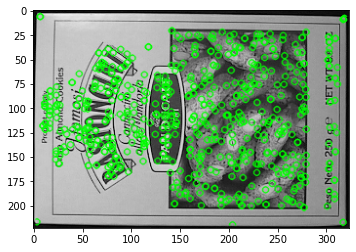

In [8]:
plt.imshow(cv2.drawKeypoints(image1,kp1,None,color=(0,255,0)))

In [22]:
x = [14,15,16]
y = []
for i in x:
  for j in x:
    y.append([i,j])
y
ints = []
for i in y:
  ints.append(image1[i[0],i[1]])
ints

[196, 195, 198, 196, 196, 199, 197, 196, 198]

Text(0.5, 0, '(b)')

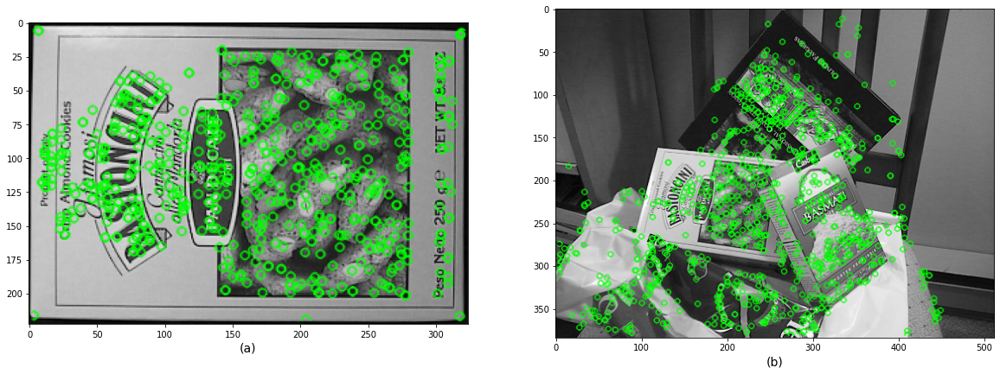

In [24]:
# display the keypoints and features detected on both images
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
ax1.imshow(cv2.drawKeypoints(image1,kp1,None,color=(0,255,0)))
ax1.set_xlabel("(a)", fontsize=14)
ax2.imshow(cv2.drawKeypoints(image2,kp2,None,color=(0,255,0)))
ax2.set_xlabel("(b)", fontsize=14)

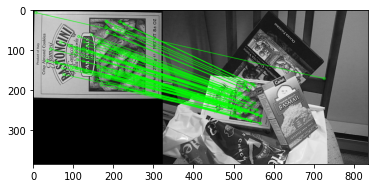

In [23]:
match = cv2.BFMatcher()
matches = match.knnMatch(des1,des2,k=2)

good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append(m)

draw_params = dict(matchColor=(0,255,0),
                       singlePointColor=None,
                       flags=2)

img3 = cv2.drawMatches(image1,kp1,image2,kp2,good,None,**draw_params)
plt.imshow(img3)

In [0]:
image1=cv2.imread('drive/My Drive/CVIT Day 4/Panorama/Eg1/img2_2.png')
image2=cv2.imread('drive/My Drive/CVIT Day 4/Panorama/Eg1/img2_1.png')

image1_gray=cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)
image2_gray=cv2.cvtColor(image2,cv2.COLOR_BGR2GRAY)

image1=cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)
image2=cv2.cvtColor(image2,cv2.COLOR_BGR2RGB)

In [0]:
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(image1_gray,None)
kp2, des2 = orb.detectAndCompute(image2_gray,None)

In [0]:
# Initiate Sift detector
sift =cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(image1,None)
kp2, des2 = sift.detectAndCompute(image2,None)

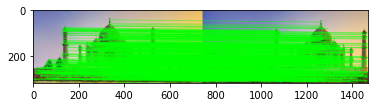

In [28]:
match = cv2.BFMatcher()
matches = match.knnMatch(des1,des2,k=2)

good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append(m)

draw_params = dict(matchColor=(0,255,0),
                       singlePointColor=None,
                       flags=2)

img3 = cv2.drawMatches(image1,kp1,image2,kp2,good,None,**draw_params)
plt.imshow(img3)

In [0]:
def trim(frame):
          #crop top
          if not np.sum(frame[0]):
              return trim(frame[1:])
          #crop bottom
          if not np.sum(frame[-1]):
              return trim(frame[:-2])
          #crop left
          if not np.sum(frame[:,0]):
              return trim(frame[:,1:])
          #crop right
          if not np.sum(frame[:,-1]):
              return trim(frame[:,:-2])
          return frame

def panorama(path_right,path_left):

      image1=cv2.imread(path_right)
      image2=cv2.imread(path_left)

      image1_gray=cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)
      image2_gray=cv2.cvtColor(image2,cv2.COLOR_BGR2GRAY)

      image1=cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)
      image2=cv2.cvtColor(image2,cv2.COLOR_BGR2RGB)

      # Initiate Sift detector
      sift =cv2.xfeatures2d.SIFT_create()
      kp1, des1 = sift.detectAndCompute(image1_gray,None)
      kp2, des2 = sift.detectAndCompute(image2_gray,None)

      # display the keypoints and features detected on both images
      #fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
      #ax1.imshow(cv2.drawKeypoints(image1_gray,kp1,None,color=(0,255,0)))
      #ax1.set_xlabel("(a)", fontsize=14)
      #ax2.imshow(cv2.drawKeypoints(image2_gray,kp2,None,color=(0,255,0)))
      #ax2.set_xlabel("(b)", fontsize=14)

      match = cv2.BFMatcher()
      matches = match.knnMatch(des1,des2,k=2)

      good = []
      for m,n in matches:
          if m.distance < 0.03*n.distance:
              good.append(m)

      draw_params = dict(matchColor=(0,255,0),
                            singlePointColor=None,
                            flags=2)

      img3 = cv2.drawMatches(image1_gray,kp1,image2_gray,kp2,good,None,**draw_params)
      #plt.imshow(img3)

      MIN_MATCH_COUNT = 10
      if len(good) > MIN_MATCH_COUNT:
          src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
          dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

          M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

          h,w = image2_gray.shape
          pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
          dst = cv2.perspectiveTransform(pts, M)
          #img2 = cv2.polylines(image2,[np.int32(dst)],True,255,3, cv2.LINE_AA)

          #plt.imshow(img2)
      else:
          print("Not enought matches are found - %d/%d", (len(good)/MIN_MATCH_COUNT))

      dst = cv2.warpPerspective(image1,M,(image2.shape[1] + image1.shape[1], image2.shape[0]+ image1.shape[0]))
      dst[0:image2.shape[0],0:image2.shape[1]] = image2
      #plt.imshow(dst)

      
      #plt.imshow(trim(dst))
      #cv2.imsave("original_image_stitched_crop.jpg", trim(dst))
      return(trim(dst))

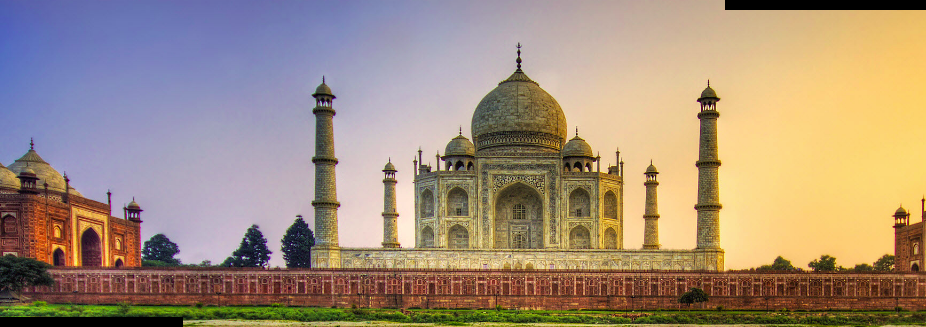

In [8]:
import os
root='drive/My Drive/CVIT Day 4/Panorama/Eg1/'
images=os.listdir(root)
save_path='drive/My Drive/CVIT Day 4/Panorama/Outputs/Eg4/'
path_right=root+images[1] 
path_left=root+images[0]
img_new=panorama(path_right,path_left)
cv2_imshow(cv2.cvtColor(img_new,cv2.COLOR_RGB2BGR))

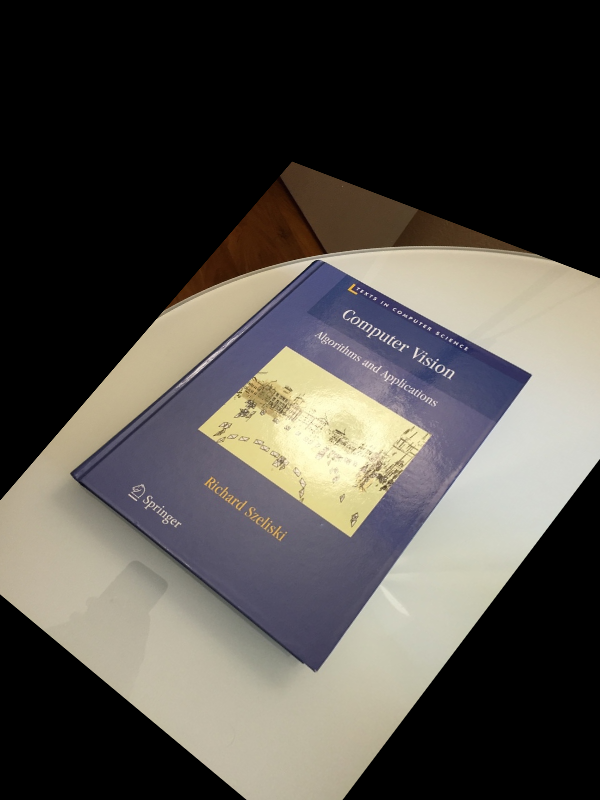

In [16]:
image1=cv2.imread('drive/My Drive/Day4 Material/book1.jpg')
image2=cv2.imread('drive/My Drive/Day4 Material/book2.jpg')
pts_src = np.array([[141, 131], [480, 159], [493, 630],[64, 601]], dtype=float)
pts_dst = np.array([[318, 256],[534, 372],[316, 670],[73, 473]], dtype=float)
h=cv2.findHomography(pts_src,pts_dst)
cv2_imshow(cv2.warpPerspective(image2,h[0],(image2.shape[1],image2.shape[0])))

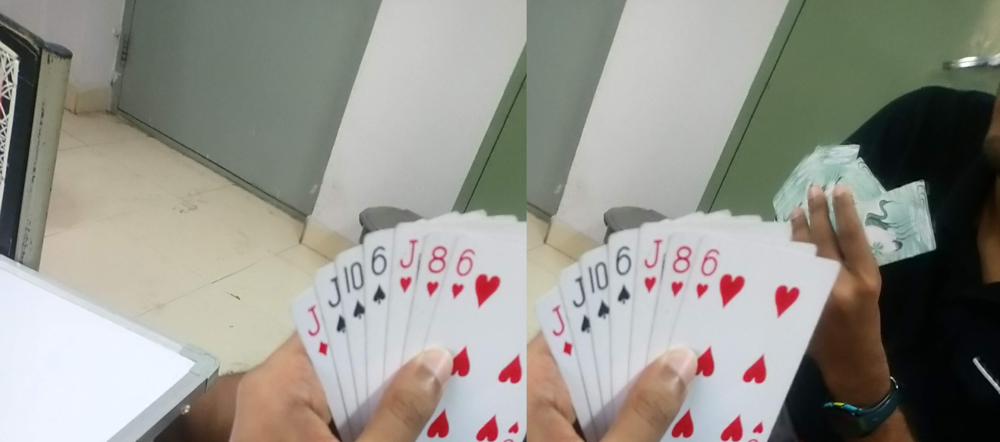

Not enought matches are found - %d/%d 0.3


UnboundLocalError: ignored

In [22]:
image1=cv2.imread('drive/My Drive/grg/1.JPG')
image2=cv2.imread('drive/My Drive/grg/2.JPG')
cv2_imshow(np.hstack([image1,image2]))
img_new=panorama('drive/My Drive/grg/1.JPG','drive/My Drive/grg/2.JPG')
cv2_imshow(cv2.cvtColor(img_new,cv2.COLOR_RGB2BGR))

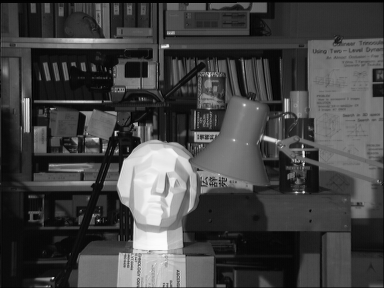

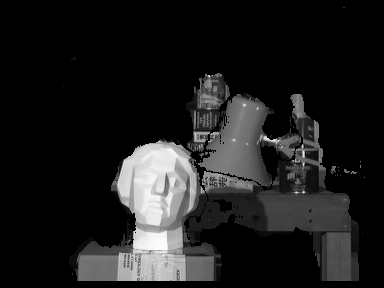

In [31]:
image1=cv2.imread('drive/My Drive/Day4 Material/tsukuba_l.png',cv2.IMREAD_GRAYSCALE)
image2=cv2.imread('drive/My Drive/Day4 Material/tsukuba_r.png',cv2.IMREAD_GRAYSCALE)
cv2_imshow(image1)
map=cv2.StereoBM_create(numDisparities=16, blockSize=15)
disparity = map.compute(image1,image2)
disparity[disparity < 120] = 0
disparity[disparity >= 120] = image1[disparity >= 120]
cv2_imshow(disparity)

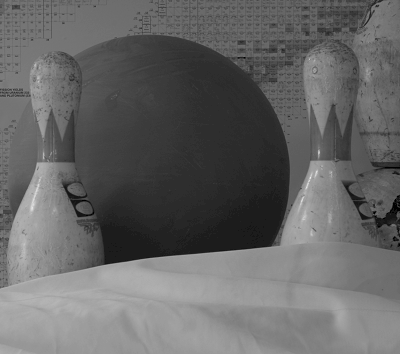

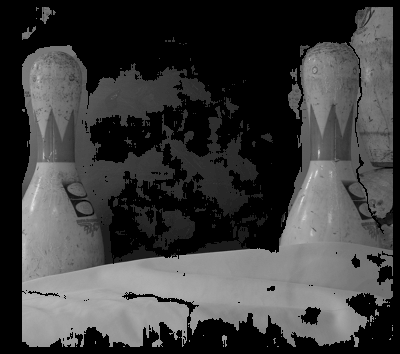

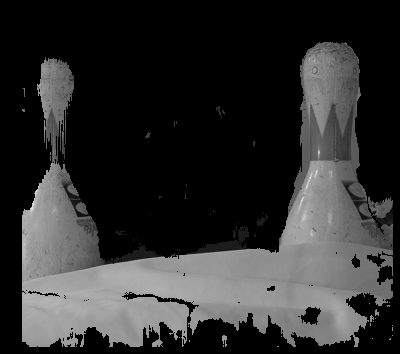

In [33]:
image1=cv2.imread('drive/My Drive/Day4 Material/view0.png',cv2.IMREAD_GRAYSCALE)
image2=cv2.imread('drive/My Drive/Day4 Material/view1.png',cv2.IMREAD_GRAYSCALE)
cv2_imshow(image1)
map=cv2.StereoBM_create(numDisparities=16, blockSize=15)
disparity = map.compute(image1,image2)
ds = disparity.copy()
ds[disparity < 120] = 0
ds[disparity >= 120] = image1[disparity >= 120]
cv2_imshow(ds)
ds2 = disparity.copy()
ds2[disparity < 160] = 0
ds2[disparity >= 160] = image1[disparity >= 160]
cv2_imshow(ds2)

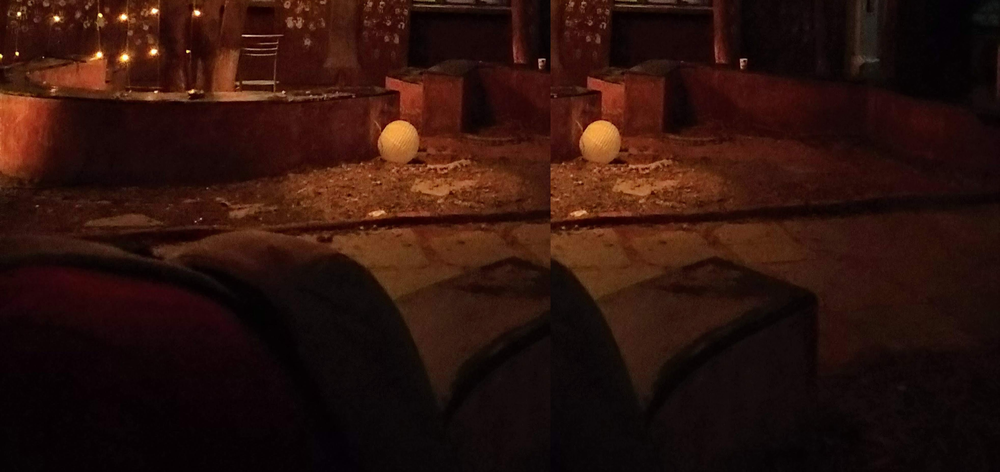

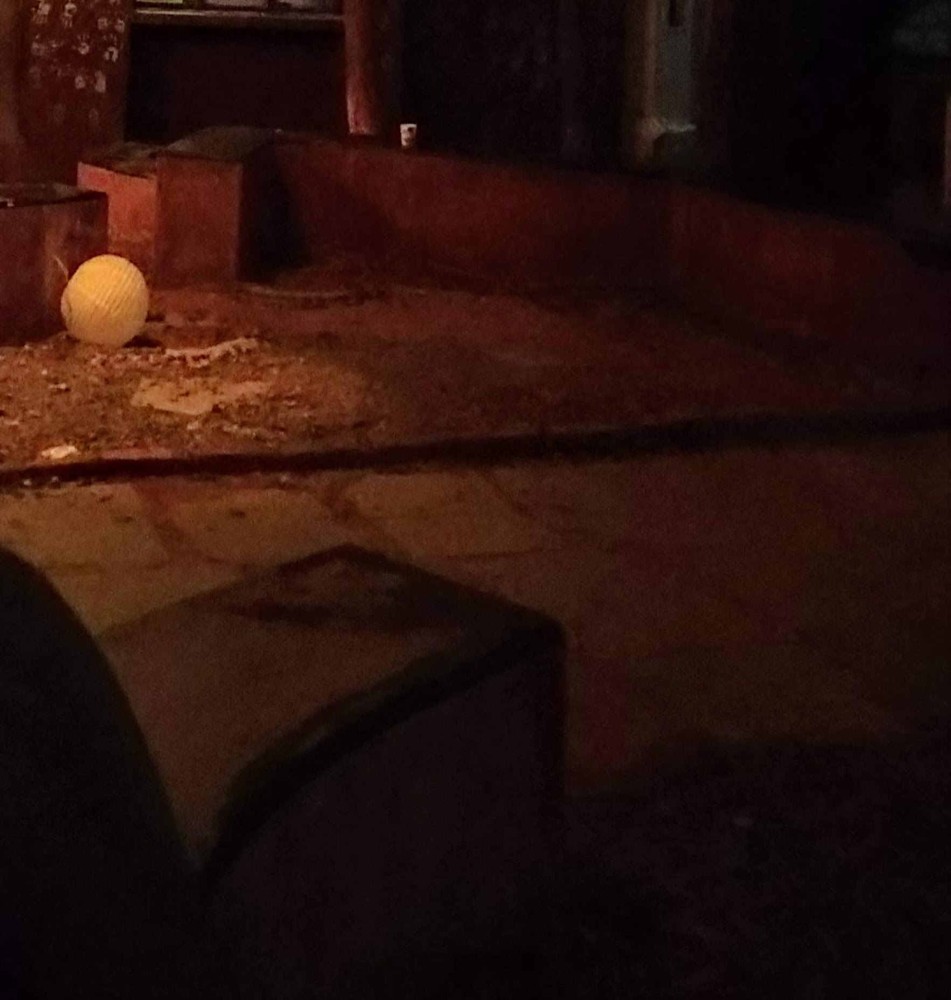

In [9]:
image1=cv2.imread('drive/My Drive/grg/3.JPG')
image2=cv2.imread('drive/My Drive/grg/4.JPG')
cv2_imshow(np.hstack([image1,image2]))
import sys
sys.setrecursionlimit(1000000000)
img_new=panorama('drive/My Drive/grg/3.JPG','drive/My Drive/grg/4.JPG')
cv2_imshow(cv2.cvtColor(img_new,cv2.COLOR_RGB2BGR))